# Items to be covered 

1. Introduce fine-tuning transfer learning with TF
2. Intriduce Keras Functional API to build models
3. Using a small dataset to experiement faster (e.g. 10% of traning samples)
4. Data augmentation within the model
5. Running series of experiments on Food Vision Data
6. Introduce ModelCheckpoint callback to save intemediate training results

In [1]:
!nvidia-smi

Mon Dec 22 00:33:19 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 590.44.01              Driver Version: 591.44         CUDA Version: 13.1     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 5070 ...    On  |   00000000:01:00.0  On |                  N/A |
| N/A   45C    P8              6W /   97W |     324MiB /  12227MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import tensorflow as tf 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimage 
import keras 
from helpers import walk_data_directory, import_and_create_train_test_ds, display_tensorboard_logs, view_all_images_in_a_batch_ds, create_tensorboard_callback, plot_loss_curves

In [3]:
data_dir = "data/10_food_classes_10_percent/"
train_dir = "data/10_food_classes_10_percent/train/"
test_dir = "data/10_food_classes_10_percent/test" 

In [4]:
walk_data_directory(data_dir)

There are 2 folders and 0 in 'data/10_food_classes_10_percent/'
There are 10 folders and 0 in 'data/10_food_classes_10_percent/test'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/chicken_curry'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/chicken_wings'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/fried_rice'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/grilled_salmon'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/hamburger'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/ice_cream'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/pizza'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/ramen'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/steak'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/sushi'
There are 10 folders and 0 in 'data/10_food_classes_10_percent/train'

In [5]:
train_ds, test_ds = import_and_create_train_test_ds(train_dir=train_dir,
                                                   test_dir=test_dir)

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [6]:
class_names = train_ds.class_names
class_names

['chicken_curry',
 'chicken_wings',
 'fried_rice',
 'grilled_salmon',
 'hamburger',
 'ice_cream',
 'pizza',
 'ramen',
 'steak',
 'sushi']

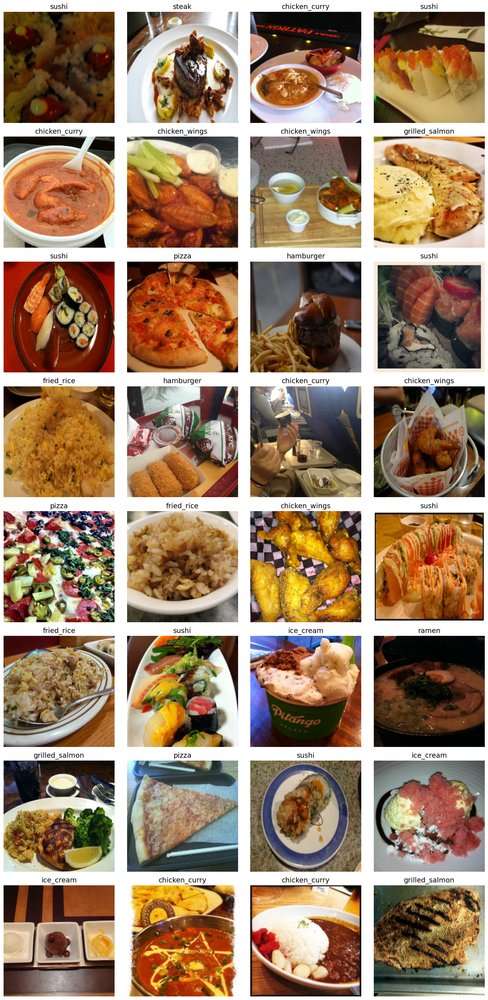

In [7]:
view_all_images_in_a_batch_ds(train_ds)

In [8]:
def build_efficientv2_models(variant="B0",
                             num_classes=len(class_names), 
                             base_trainable=False, 
                             lr=1e-3,
                             batch_size=32, 
                             dropout=0.2
                            ): 

    model_name = f"EfficientNetV2{variant}"
    try:
        BaseModel = getattr(keras.applications, model_name)
    except AttributeError:
        raise ValueError(f"Invalid EfficientNetV2 variant: {variant}")

    EFFICIENTNETV2_SIZES = {
        "B0": (224, 224),
        "B1": (240, 240),
        "B2": (260, 260),
        "B3": (300, 300),
        "S":  (384, 384),
        "M":  (480, 480),
        "L":  (480, 480),
    }

    img_size = EFFICIENTNETV2_SIZES[variant]

    base_model = BaseModel(
                    include_top=False,
                    weights="imagenet",
                    input_shape=img_size + (3,),
                    pooling="avg",
                )

    base_model.trainable = base_trainable 

    inputs = keras.Input(shape=img_size+(3,), name="input_layer") 
    x = keras.applications.efficientnet_v2.preprocess_input(inputs) 
    x = base_model(x, training=False)
    # x=keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    x = keras.layers.Dropout(dropout)(x)
    outputs = keras.layers.Dense(num_classes, activation='softmax', name="output_layer")(x) 

    model = keras.Model(inputs, outputs, name=model_name) 
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(), 
        optimizer=keras.optimizers.Adam(learning_rate=lr), 
        metrics=["accuracy"]
    )
    return model

efficientnetv2b0_model = build_efficientv2_models(variant="B0", 
                                                  num_classes=len(class_names))

efficientnetv2b0_model.summary()
    

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "EfficientNetV2B0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [9]:
history_efficientnetv2b0 = efficientnetv2b0_model.fit(
                                train_ds,
                                validation_data=test_ds, 
                                epochs=6, 
                                validation_steps=int(0.25 * (len(test_ds))), 
                                callbacks=[create_tensorboard_callback(
                                                        dir_name="/workspace/tensorflow/tensorboard/",
                                                        experiment_name="EfficientNetV2B0"
                                                        )
                                          ]
                            )

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/EfficientNetV2B0/20251222-003328
Epoch 1/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 31s 544ms/step - accuracy: 0.2307 - loss: 2.1686 - val_accuracy: 0.7188 - val_loss: 1.3661
Epoch 2/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.6884 - loss: 1.3184 - val_accuracy: 0.8191 - val_loss: 0.9322
Epoch 3/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7912 - loss: 0.9342 - val_accuracy: 0.8322 - val_loss: 0.7713
Epoch 4/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8104 - loss: 0.7676 - val_accuracy: 0.8405 - val_loss: 0.6494
Epoch 5/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 235ms/step - accuracy: 0.8488 - loss: 0.6436 - val_accuracy: 0.7941 - val_loss: 0.6571
Epoch 6/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.8820 - loss: 0.5650 - val_accuracy: 0.8635 - val_loss: 0.5136


In [10]:
for layer_number, layer in enumerate(efficientnetv2b0_model.layers): 
    print(layer_number, layer.name)

0 input_layer
1 efficientnetv2-b0
2 dropout
3 output_layer


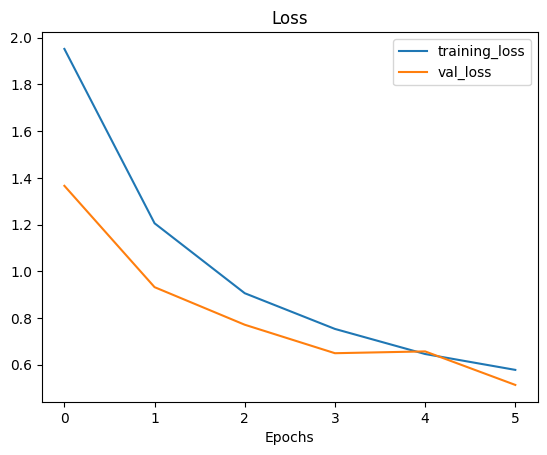

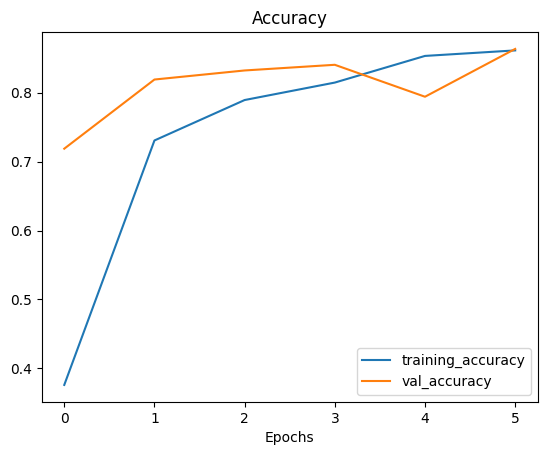

In [11]:
plot_loss_curves(history_efficientnetv2b0)

In [12]:
## Extracting vector out of the model 

shape = (1, 7, 7, 5)
tf_1 = tf.random.normal(shape=shape)

In [13]:
tf_1_vecorized = keras.layers.GlobalAveragePooling2D()(tf_1)
tf_1_vecorized

<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[ 0.0459794 , -0.00227687, -0.05587029, -0.05423525,  0.09983888]],
      dtype=float32)>

In [14]:
tf.reduce_mean(tf_1, axis=(1, 2))

<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[ 0.0459794 , -0.00227687, -0.05587029, -0.05423525,  0.09983888]],
      dtype=float32)>

In [15]:
tf_1_max_pooled = keras.layers.GlobalMaxPool2D()(tf_1)
tf_1_max_pooled


<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[2.031196 , 2.327334 , 1.673286 , 2.733827 , 1.8696157]],
      dtype=float32)>

In [16]:
## Sample efficientv2 model with GlobalAveragePooloing2d 

# 1. Create base model with keras.applications api 
# base_model = keras.applications.EfficientNetV2B0(include_top=False, name="base_model")
base_model = keras.applications.EfficientNetV2B0(include_top=False)

# 2. Freeze the base model (so the pre-learned patterns remain) 
base_model.trainable=False 

# 3. Create inputs into base_model
inputs=keras.Input(shape=(224, 224, 3), name="input_layer")

# 4. If using ResNet50V2, add this to speed up convergence, remove for EfficientNetV2
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# 5. Pass the inputs to the base model 
x = base_model(inputs) 
# Check inputs shape after passing inputs to base model 
print(f"Shape after base_model : {x.shape}") 

# 6. Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations) 
x = keras.layers.GlobalAveragePooling2D(name="GlobalAveragePooling2D")(x) 
print(f"Shape after GlobalAveragePooling2D() : {x.shape}") 

# 7. Create the output for the activation layer 
outputs = keras.layers.Dense(10, activation="softmax", name="output_layer")(x) 

# 8. Create the model 
model_0 = keras.Model(inputs, outputs, name="EfficientNetV2B0")

# 9. Compile the model 
model_0.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(), 
    metrics=["accuracy"]
)

# 10. Get Model Summary 
model_0.summary() 

# 11. Fit the mmodel_0 
model_0.fit(
    train_ds, 
    validation_data=test_ds, 
    epochs=6,
    validation_steps=int(0.25 * (len(test_ds))),
    callbacks=[create_tensorboard_callback(
        dir_name="/workspace/tensorflow/tensorboard/", 
        experiment_name=""
    )]
)

Shape after base_model : (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D() : (None, 1280)


Model: "EfficientNetV2B0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ GlobalAveragePooling2D          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/20251222-003408
Epoch 1/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 25s 436ms/step - accuracy: 0.2646 - loss: 2.1329 - val_accuracy: 0.7451 - val_loss: 1.2945
Epoch 2/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.7271 - loss: 1.2459 - val_accuracy: 0.7829 - val_loss: 0.9310
Epoch 3/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8087 - loss: 0.9016 - val_accuracy: 0.8257 - val_loss: 0.7543
Epoch 4/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8009 - loss: 0.7203 - val_accuracy: 0.8372 - val_loss: 0.6106
Epoch 5/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.8620 - loss: 0.6112 - val_accuracy: 0.8088 - val_loss: 0.6611
Epoch 6/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.8801 - loss: 0.5323 - val_accuracy: 0.8799 - val_loss: 0.5027


## Running a series of Transfer Learning Experiences 

1. Done 

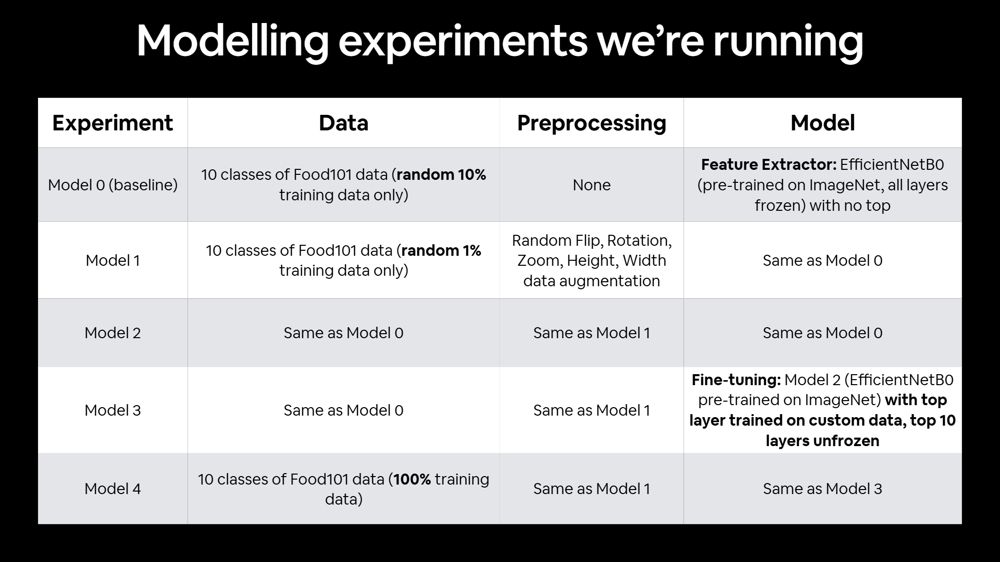

### Model-1 
**feature extraction** transfer learning  with **1%** of the training data  and **data augmentation** 

### Model-2 
**feature extraction** transfer learning  with **10%** of the training data  and **data augmentation**  

### Model-3 
**fine tuning** transfer learning  with **10%** of the training data  and **data augmentation**  

### Model-4
**fine tuning** transfer learning  with **100%** of the training data  and **data augmentation**  

In [17]:
train_dir_1_percent = "data/10_food_classes_1_percent/train/" 
test_dir_1_percent = "data/10_food_classes_1_percent/test/"

In [18]:
walk_data_directory("data/10_food_classes_1_percent/")

There are 2 folders and 0 in 'data/10_food_classes_1_percent/'
There are 10 folders and 0 in 'data/10_food_classes_1_percent/test'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/chicken_curry'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/chicken_wings'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/fried_rice'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/grilled_salmon'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/hamburger'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/ice_cream'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/pizza'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/ramen'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/steak'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/sushi'
There are 10 folders and 0 in 'data/10_food_classes_1_percent/train'
There are 0 

In [19]:
# Create 1_percent train & test dataset
train_ds_1_percent, test_ds_1_percent = import_and_create_train_test_ds(train_dir=train_dir_1_percent, 
                                                                       test_dir=test_dir_1_percent)

Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


## Adding Data Augmentation right into the model

In [20]:
print(tf.__version__)

2.17.0


In [21]:
import tensorflow as tf 
import keras 
from keras import layers

## Benefits of data augmentation 

https://www.tensorflow.org/tutorials/images/data_augmentation

* Preprocessing of images (augmentation) happens on GPU
* Image data augmentation only happens training, we can still export our whole model and use it elsewhere 

In [22]:
## Create data augmentation stage with horizontal flipping, rotations, zooms, etc 

from keras import layers
import keras

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

In [23]:
import math
import numpy as np
import matplotlib.pyplot as plt

def view_same_image_multiple_augmentations(
    data_ds,
    data_augmentation,
    num_images=4,
    num_augments=4,
    img_size=3.5,
    show_original=True,
):
    class_names = getattr(data_ds, "class_names", None)

    images, labels = next(iter(data_ds))
    images = images[:num_images]
    labels = labels[:num_images]

    cols = num_augments + (1 if show_original else 0)
    rows = num_images

    plt.figure(figsize=(cols * img_size, rows * img_size))

    plot_idx = 1
    for i in range(num_images):
        # label
        if labels.ndim == 1:
            label_idx = int(labels[i].numpy())
        else:
            label_idx = int(np.argmax(labels[i].numpy()))
        label_name = class_names[label_idx] if class_names else str(label_idx)

        # original
        if show_original:
            plt.subplot(rows, cols, plot_idx)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"{label_name}\n(original)", fontsize=12)
            plt.axis("off")
            plot_idx += 1

        # augmented versions (same image, multiple draws)
        for j in range(num_augments):
            plt.subplot(rows, cols, plot_idx)

            aug_img = data_augmentation(images[i], training=True).numpy()

            if aug_img.dtype != np.uint8:
                aug_img = np.clip(aug_img, 0, 255).astype("uint8")

            plt.imshow(aug_img)
            plt.title(f"aug {j+1}", fontsize=11)
            plt.axis("off")
            plot_idx += 1

    plt.tight_layout()
    plt.show()


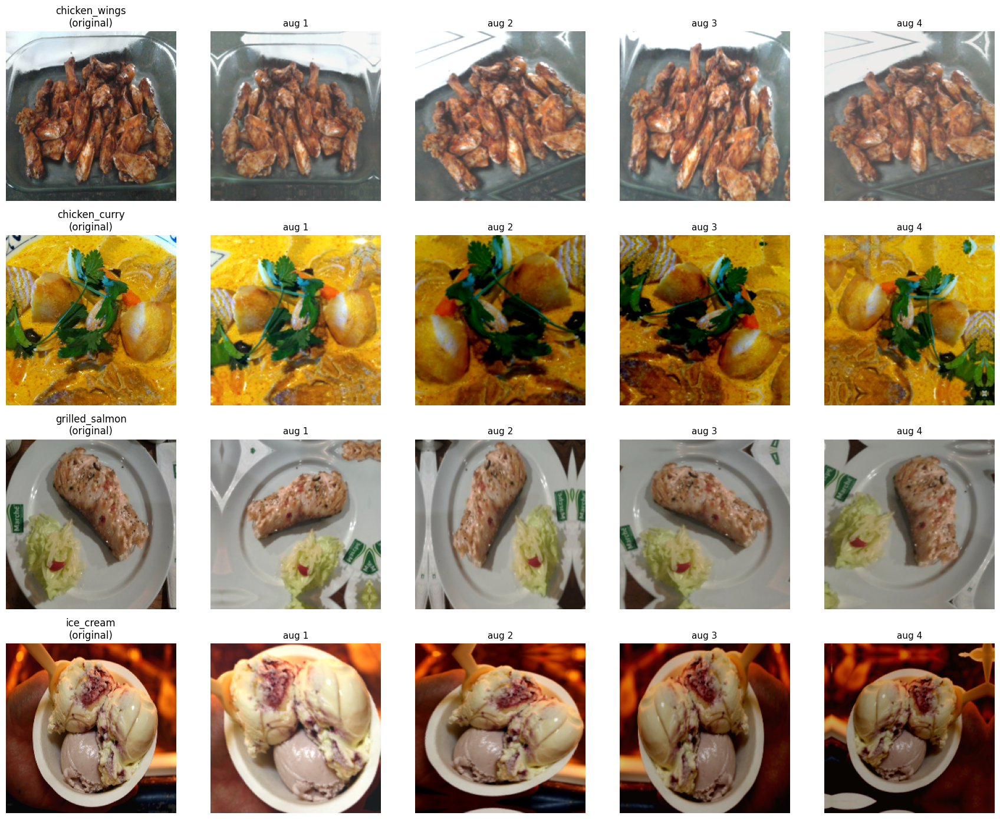

In [24]:
view_same_image_multiple_augmentations(
    train_ds,
    data_augmentation,
    num_images=4,
    num_augments=4,
    img_size=3.5,
)


In [25]:
import keras
from keras import layers

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

# 1) Base model (feature extractor)
base_model = keras.applications.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
)
base_model.trainable = False

# 2) Build model
inputs = keras.Input(shape=(224, 224, 3), name="input_layer")

x = data_augmentation(inputs)                 # ✅ augment images
# x = layers.Rescaling(1./255)(x)               # ✅ if your inputs are 0..255 (common)
x = base_model(x, training=False)             # ✅ keep BN in inference mode
x = layers.GlobalAveragePooling2D(name="gap")(x)

outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

model_1 = keras.Model(inputs, outputs, name="experiment_1")

model_1.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=[keras.metrics.CategoricalAccuracy(name="accuracy")]
)

model_1.summary()


Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [26]:
history_1 = model_1.fit(
    train_ds_1_percent,
    validation_data=test_ds_1_percent, 
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="one_percent_data_aug"
        )
    ],
    epochs=6, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/one_percent_data_aug/20251222-003443
Epoch 1/6
3/3 - 13s - 4s/step - accuracy: 0.1857 - loss: 2.3531 - val_accuracy: 0.2444 - val_loss: 2.2177
Epoch 2/6
3/3 - 2s - 705ms/step - accuracy: 0.2714 - loss: 2.1661 - val_accuracy: 0.3000 - val_loss: 2.0946
Epoch 3/6
3/3 - 2s - 706ms/step - accuracy: 0.3571 - loss: 2.0100 - val_accuracy: 0.3612 - val_loss: 1.9897
Epoch 4/6
3/3 - 2s - 665ms/step - accuracy: 0.4429 - loss: 1.8446 - val_accuracy: 0.4184 - val_loss: 1.8937
Epoch 5/6
3/3 - 2s - 678ms/step - accuracy: 0.5286 - loss: 1.7138 - val_accuracy: 0.4620 - val_loss: 1.8062
Epoch 6/6
3/3 - 2s - 667ms/step - accuracy: 0.6286 - loss: 1.5895 - val_accuracy: 0.4936 - val_loss: 1.7245


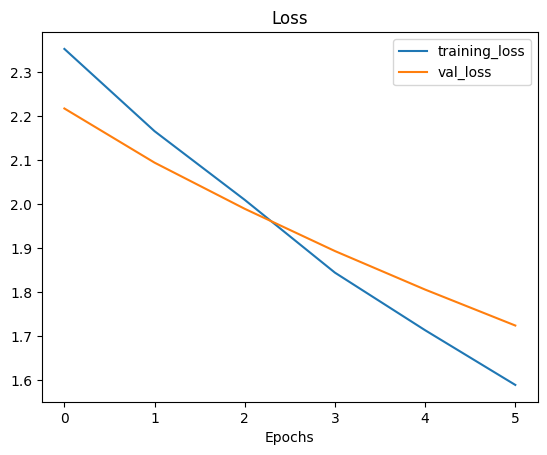

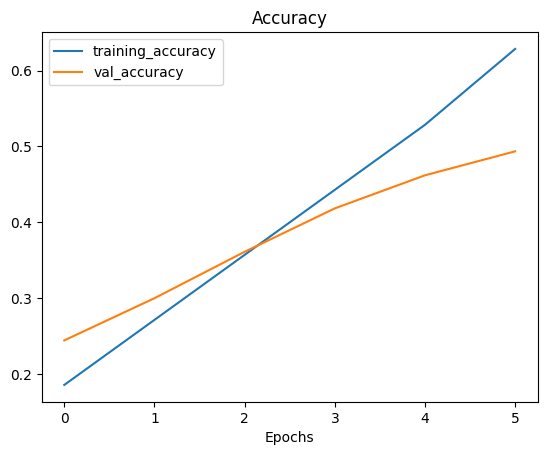

In [27]:
plot_loss_curves(history_1)

In [33]:
## Model 2 : Feature extraction, data_augmentation, 10_percent_train_data 

import keras
from keras import layers

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

# 1) Base model (feature extractor)
base_model = keras.applications.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
)
base_model.trainable = False

# 2) Build model
inputs = keras.Input(shape=(224, 224, 3), name="input_layer")

x = data_augmentation(inputs)                 # ✅ augment images
# x = layers.Rescaling(1./255)(x)               # ✅ if your inputs are 0..255 (common)
x = base_model(x, training=False)             # ✅ keep BN in inference mode
x = layers.GlobalAveragePooling2D(name="gap")(x)

outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

model_2 = keras.Model(inputs, outputs, name="experiment_1")

model_2.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=[keras.metrics.CategoricalAccuracy(name="accuracy")]
)

model_2.summary()


Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [34]:
history_2 = model_2.fit(
    train_ds,
    validation_data=test_ds, 
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="ten_percent_data_aug"
        )
    ],
    epochs=8, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/ten_percent_data_aug/20251222-003656
Epoch 1/8
24/24 - 14s - 603ms/step - accuracy: 0.3160 - loss: 2.0113 - val_accuracy: 0.6748 - val_loss: 1.4685
Epoch 2/8
24/24 - 4s - 161ms/step - accuracy: 0.6613 - loss: 1.3879 - val_accuracy: 0.7736 - val_loss: 1.0345
Epoch 3/8
24/24 - 3s - 143ms/step - accuracy: 0.7347 - loss: 1.0769 - val_accuracy: 0.8140 - val_loss: 0.8169
Epoch 4/8
24/24 - 4s - 147ms/step - accuracy: 0.7733 - loss: 0.9124 - val_accuracy: 0.8304 - val_loss: 0.7033
Epoch 5/8
24/24 - 4s - 146ms/step - accuracy: 0.7880 - loss: 0.8049 - val_accuracy: 0.8372 - val_loss: 0.6274
Epoch 6/8
24/24 - 4s - 146ms/step - accuracy: 0.7987 - loss: 0.7341 - val_accuracy: 0.8452 - val_loss: 0.5833
Epoch 7/8
24/24 - 3s - 145ms/step - accuracy: 0.8347 - loss: 0.6732 - val_accuracy: 0.8564 - val_loss: 0.5385
Epoch 8/8
24/24 - 3s - 143ms/step - accuracy: 0.8453 - loss: 0.6350 - val_accuracy: 0.8564 - val_loss: 0.5209


In [37]:
model_0.evaluate(test_ds), model_1.evaluate(test_ds), model_2.evaluate(test_ds)

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8723 - loss: 0.5070
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.5052 - loss: 1.7120
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.8652 - loss: 0.5062


([0.5306868553161621, 0.8628000020980835],
 [1.7244646549224854, 0.4936000108718872],
 [0.5208565592765808, 0.8564000129699707])

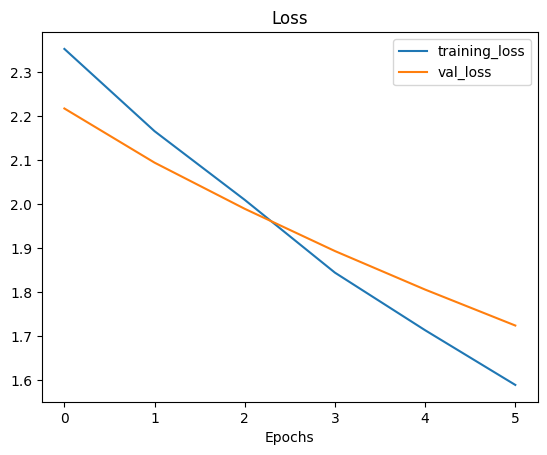

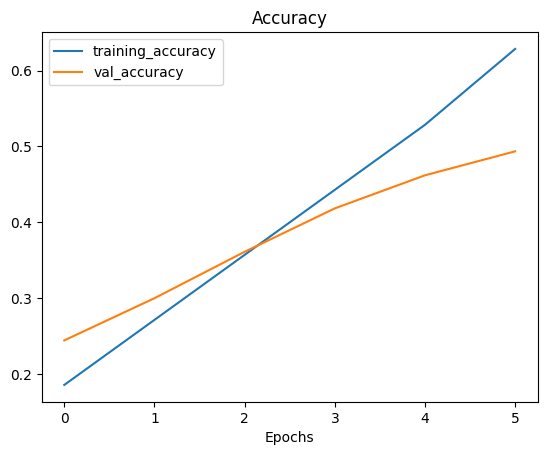

In [31]:
plot_loss_curves(history_1) 

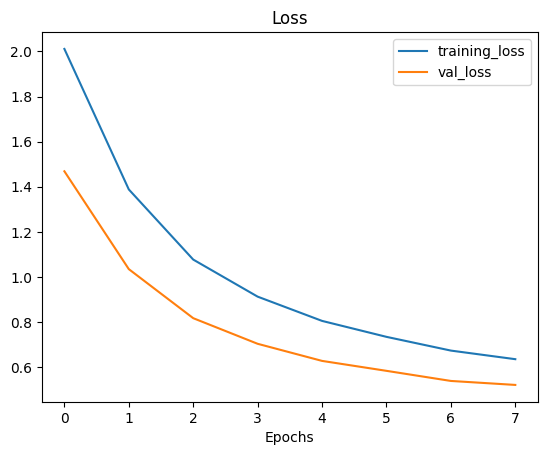

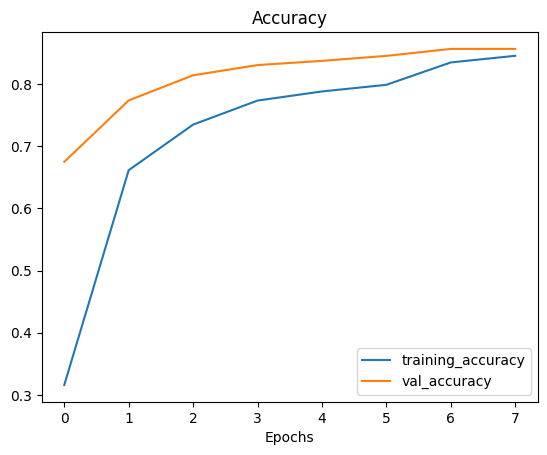

In [36]:
plot_loss_curves(history_2)